In [1]:
%matplotlib inline
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re
import util
from model import AffineNet
from model import AffineNet1
import train

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
path = "DATA_FINAL/"

dataset = np.load(path+'dataset.npz')

imgs_rgb = dataset['rgb']
imgs_ir = dataset['ir']
imgs_mask_rgb = dataset['mask_rgb']
imgs_mask_ir = dataset['mask_ir']

In [3]:
print(imgs_rgb.shape, imgs_ir.shape, imgs_mask_rgb.shape, imgs_mask_ir.shape)

(10431, 240, 320, 3) (10431, 240, 320, 3) (10431, 240, 320) (10431, 240, 320)


In [4]:
model = AffineNet().to(device)

In [5]:
beg = 1000
end = 2000

imRGB = util.parseImages(imgs_mask_rgb, end)
imRGB = imRGB[beg:end, ...]

imIR = util.parseImages(imgs_mask_ir, end)
imIR = imIR[beg:end, ...]

imIR.shape

torch.Size([1000, 1, 240, 320])

In [6]:
mini_batch_size = 20
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [7]:
model = model.to(device)

res = train.train2(model, imRGB, imIR, 20, mini_batch_size, criterion, optimizer)

C:\Users\lucaw\Anaconda3\lib\site-packages\torch\nn\functional.py:2764: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
C:\Users\lucaw\Anaconda3\lib\site-packages\torch\nn\functional.py:2705: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


epoch 1: loss = 6.356153327971697
epoch 2: loss = 5.996369898319244
epoch 3: loss = 6.005962174385786
epoch 4: loss = 5.988149713724852
epoch 5: loss = 5.906175021082163
epoch 6: loss = 5.895287849009037
epoch 7: loss = 5.865636833012104
epoch 8: loss = 5.787970218807459
epoch 9: loss = 5.843415059149265
epoch 10: loss = 5.661561783403158
epoch 11: loss = 5.758624829351902
epoch 12: loss = 5.779574058949947
epoch 13: loss = 5.690591160207987
epoch 14: loss = 5.743100848048925
epoch 15: loss = 5.70064140483737
epoch 16: loss = 5.71844569966197
epoch 17: loss = 5.640542887151241
epoch 18: loss = 5.6923618875443935
epoch 19: loss = 5.644363183528185
epoch 20: loss = 5.654974207282066


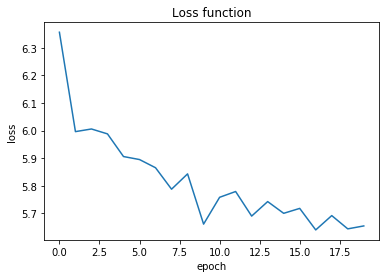

In [9]:
x = list(range(0, 20))
fig = plt.figure()
ax = plt.axes()
ax.plot(x, res);
plt.title("Loss function")
ax = ax.set(xlabel='epoch', ylabel='loss')

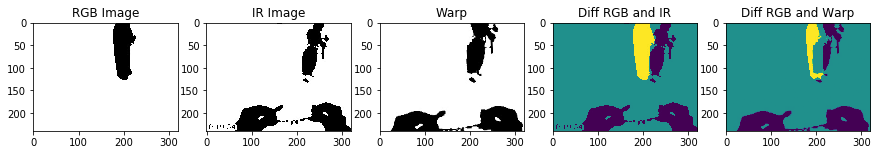

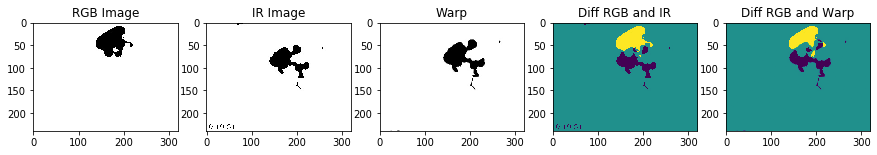

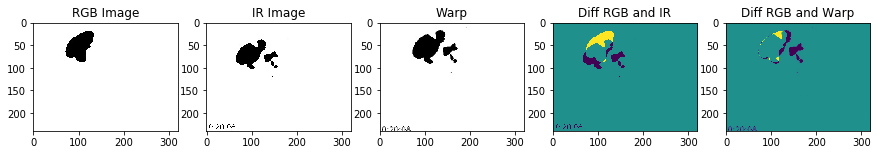

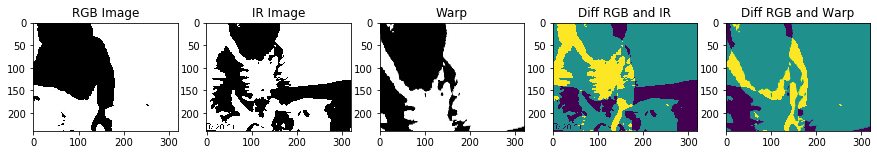

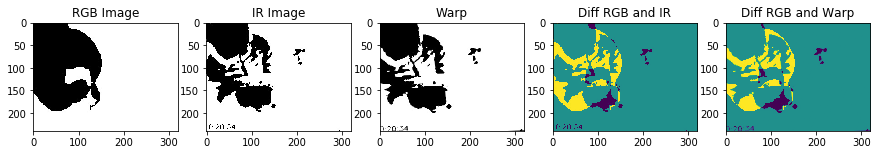

...

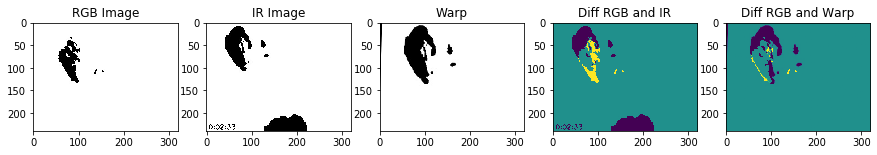

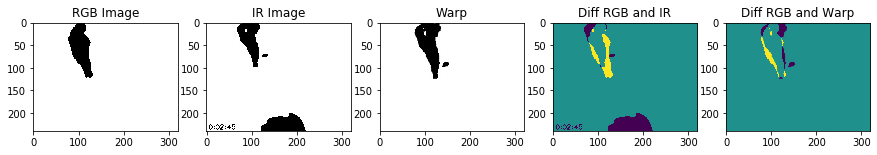

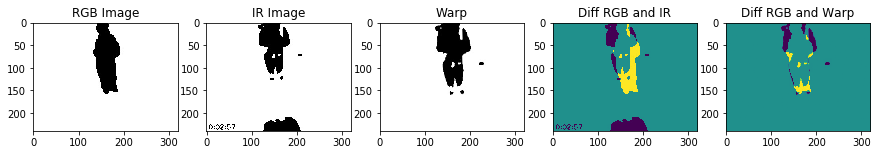

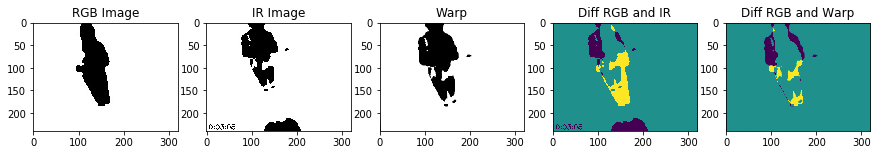

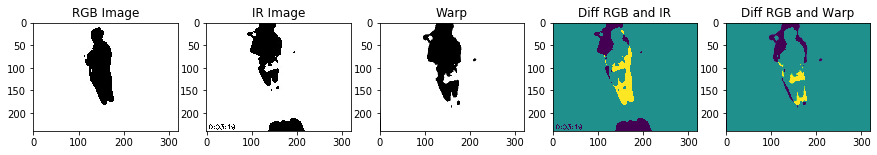

In [34]:
for i in range(0, 1000, 25):
    util.printResult(*util.getImagesById(imRGB.cpu(), imIR.cpu(), i, model.cpu()), cmap='viridis')

In [18]:
flows = util.getAllFlows(imIR, model)

flows.shape

torch.Size([1000, 240, 320, 2])

In [19]:
x = util.applyFlowToColoredImages(imgs_ir, flows, 1000, 2000)
x.shape

(1000, 240, 320, 3)

In [20]:
superposedImages = util.superposeTwoImages(imgs_rgb[1000:2000], (x*255).astype('uint8'))
superposedImages2 = util.superposeTwoImages(imgs_rgb[1000:2000], imgs_ir[1000:2000])
print(superposedImages.shape, superposedImages2.shape)

(1000, 240, 320, 3) (1000, 240, 320, 3)


C:\Users\lucaw\Documents\EPFL\BachelorProjectFinal\util.py:395: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 15))


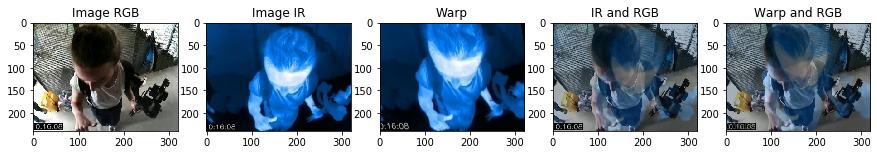

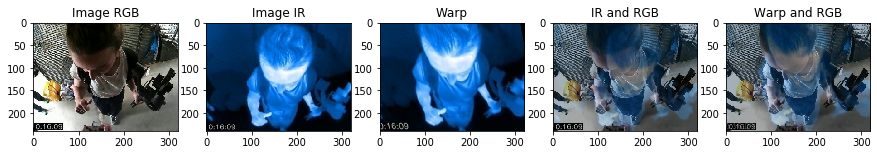

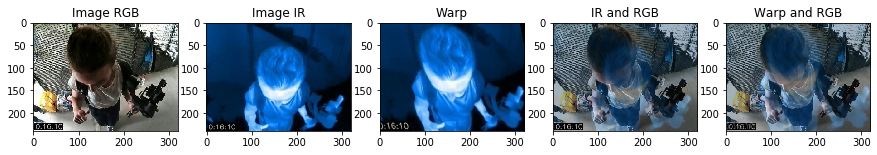

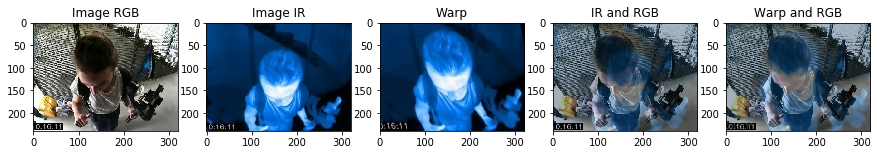

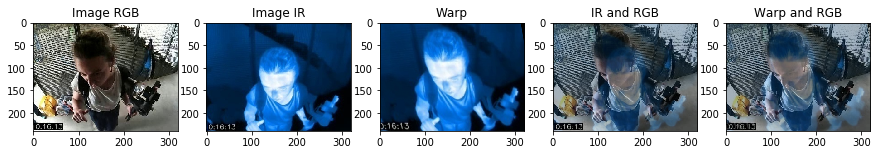

...

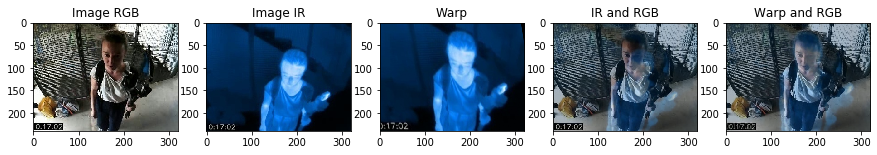

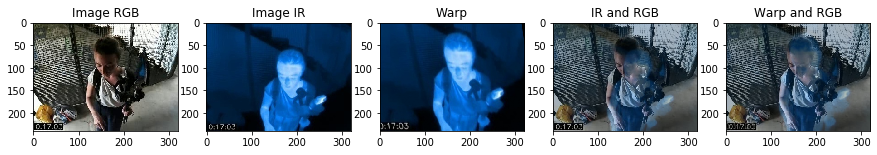

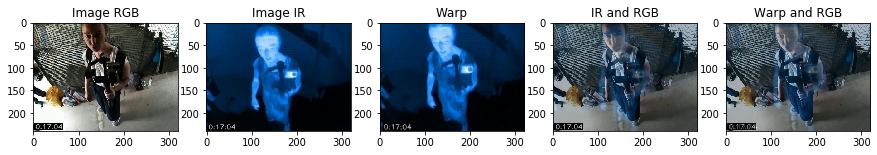

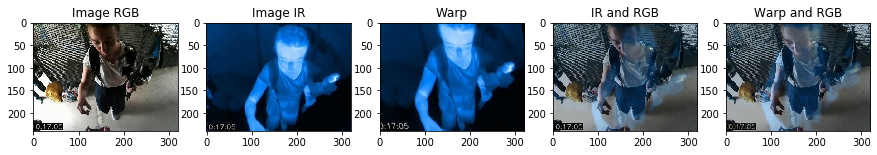

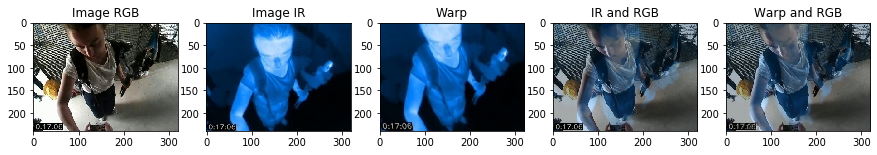

In [21]:
for i in range(500, 1000, 10):
    util.printFinal(x[i], imgs_rgb[i+1000], imgs_ir[i+1000], superposedImages[i], superposedImages2[i])